In [1]:
import warnings
warnings.filterwarnings("ignore")

from glob import glob
import os
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
from torch_em.data import MinInstanceSampler
from torch_em.util.util import get_random_colors
import micro_sam.training as sam_training
import importlib

def import_module(module_name, file_path):
    spec = importlib.util.spec_from_file_location(module_name, file_path)
    module = importlib.util.module_from_spec(spec)
    spec.loader.exec_module(module)
    return module

home_dir = '/Users/aatmikmallya/Desktop/research/fly/segmentation'
utils = import_module('utils', f'{home_dir}/util_files/utils.py')
config = import_module('config', f'{home_dir}/util_files/config.py')
voxel_utils = import_module('voxel_utils', f'{home_dir}/util_files/voxel_utils.py')
segmentation = import_module('segmentation', f'{home_dir}/util_files/segmentation.py')
analysis = import_module('analysis', f'{home_dir}/util_files/analysis.py')

ModuleNotFoundError: No module named 'torch_em'

In [94]:
import warnings
warnings.filterwarnings("ignore")

import os
import numpy as np
import torch
from pathlib import Path
import micro_sam.training as sam_training
from torch_em.data import MinInstanceSampler
import datetime
import logging
import tifffile
import shutil
from torch.utils.data import DataLoader
from torchvision import transforms

def verify_shapes(image_dir, label_dir):
    """Verify shapes of all images and labels"""
    for img_file in sorted(Path(image_dir).glob('*.tif')):
        img = tifffile.imread(img_file)
        label = tifffile.imread(str(Path(label_dir) / img_file.name))
        print(f"File: {img_file.name}")
        print(f"  Image shape: {img.shape}")
        print(f"  Label shape: {label.shape}")
        print(f"  Image dtype: {img.dtype}")
        print(f"  Label dtype: {label.dtype}")
        print("---")

def convert_npy_to_tif(base_dir='training', temp_dir='training_tif'):
    """Convert .npy files to .tif format"""
    # Create temporary directories
    os.makedirs(os.path.join(temp_dir, 'images'), exist_ok=True)
    os.makedirs(os.path.join(temp_dir, 'labels'), exist_ok=True)
    
    # Convert volume files
    volume_dir = os.path.join(base_dir, 'subvols', 'image')
    for npy_file in Path(volume_dir).glob('*.npy'):
        volume = np.load(npy_file)
        print(f"Loading volume {npy_file.name}, shape: {volume.shape}, dtype: {volume.dtype}")
        # Normalize and ensure float32
        volume = volume.astype(np.float32) / 255.0
        if volume.ndim == 3:
            volume = volume[None]  # Add channel dimension
        tif_path = os.path.join(temp_dir, 'images', npy_file.stem + '.tif')
        tifffile.imwrite(tif_path, volume)
    
    # Convert label files
    label_dir = os.path.join(base_dir, 'instance_masks')
    for npy_file in Path(label_dir).glob('*.npy'):
        label = np.load(npy_file)
        print(f"Loading label {npy_file.name}, shape: {label.shape}, dtype: {label.dtype}")
        # Process label
        label = label.astype(np.uint8)
        label = label[None]  # Add channel dimension
        tif_path = os.path.join(temp_dir, 'labels', npy_file.stem + '.tif')
        tifffile.imwrite(tif_path, label)
    
    print(f"Converted files in {volume_dir} to {os.path.join(temp_dir, 'images')}")
    print(f"Converted files in {label_dir} to {os.path.join(temp_dir, 'labels')}")
    
    print("\nVerifying converted files...")
    verify_shapes(os.path.join(temp_dir, 'images'), os.path.join(temp_dir, 'labels'))
    
    return os.path.join(temp_dir, 'images'), os.path.join(temp_dir, 'labels')

class EMDataLoader(DataLoader):
    """Custom DataLoader that exposes the shuffle attribute"""
    def __init__(self, *args, shuffle=False, **kwargs):
        super().__init__(*args, shuffle=shuffle, **kwargs)
        self.shuffle = shuffle

def get_device():
    """Get the best available device"""
    if torch.backends.mps.is_available():
        return torch.device("mps")
    elif torch.cuda.is_available():
        return torch.device("cuda")
    return torch.device("cpu")

def train_sam(
    base_dir='training',
    model_type='vit_b',
    n_epochs=5,
    batch_size=1,
    device=None,
    checkpoint_name='sam_em_3d',
    log_dir='logs'
):
    # Setup logging
    os.makedirs(log_dir, exist_ok=True)
    timestamp = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')
    log_file = os.path.join(log_dir, f'training_{timestamp}.log')
    
    logging.basicConfig(
        level=logging.INFO,
        format='%(asctime)s - %(levelname)s - %(message)s',
        handlers=[
            logging.FileHandler(log_file),
            logging.StreamHandler()
        ]
    )
    logger = logging.getLogger()
    
    logger.info("Starting SAM training...")
    
    if device is None:
        device = get_device()
    logger.info(f"Using device: {device}")
    
    # Convert numpy files to tif
    temp_dir = 'training_tif'
    image_dir, label_dir = convert_npy_to_tif(base_dir, temp_dir)
    logger.info(f"Converted numpy files to tif format in {temp_dir}")
    
    # Create sampler
    sampler = MinInstanceSampler(min_size=25)
    
    # Create train loader
    train_loader = sam_training.default_sam_loader(
        raw_paths=image_dir,
        raw_key="*.tif",
        label_paths=label_dir,
        label_key="*.tif",
        batch_size=batch_size,
        patch_shape=(100, 100, 100),
        with_segmentation_decoder=True,
        is_seg_dataset=True,
        shuffle=True,
        sampler=sampler,
        raw_transform=sam_training.identity  # Changed from transform to raw_transform
    )
    
    # Create validation loader
    val_loader = sam_training.default_sam_loader(
        raw_paths=image_dir,
        raw_key="*.tif",
        label_paths=label_dir,
        label_key="*.tif",
        batch_size=batch_size,
        patch_shape=(100, 100, 100),
        with_segmentation_decoder=True,
        is_seg_dataset=True,
        shuffle=False,
        sampler=sampler,
        raw_transform=sam_training.identity  # Changed from transform to raw_transform
    )
    
    logger.info(f"Created dataloaders")
    
    # Verify data from loader
    sample_batch = next(iter(train_loader))
    logger.info("Sample batch shapes:")
    for i, item in enumerate(sample_batch):
        logger.info(f"Item {i} shape: {item.shape if hasattr(item, 'shape') else 'no shape'}")
    
    # Create save directory
    save_root = Path("models")
    save_root.mkdir(exist_ok=True)
    
    try:
        logger.info("Starting training...")
        sam_training.train_sam(
            name=checkpoint_name,
            train_loader=train_loader,
            val_loader=val_loader,
            model_type=model_type,
            device=device,
            n_epochs=n_epochs,
            save_root=save_root,
            with_segmentation_decoder=True
        )
        logger.info("Training completed successfully!")
        
        best_checkpoint = save_root / "checkpoints" / checkpoint_name / "best.pt"
        logger.info(f"Best checkpoint saved at: {best_checkpoint}")
        
        # Clean up temporary directory
        shutil.rmtree(temp_dir)
        
        return str(best_checkpoint)
        
    except Exception as e:
        logger.error(f"Training failed with error: {str(e)}")
        # Clean up on error too
        shutil.rmtree(temp_dir)
        raise

if __name__ == "__main__":
    try:
        checkpoint_path = train_sam()
        print(f"Training completed. Best checkpoint saved at: {checkpoint_path}")
    except Exception as e:
        print(f"Training failed with error: {str(e)}")

2024-11-05 16:41:32,046 - INFO - Starting SAM training...
2024-11-05 16:41:32,048 - INFO - Using device: mps
2024-11-05 16:41:32,067 - INFO - Converted numpy files to tif format in training_tif
2024-11-05 16:41:32,103 - INFO - Created dataloaders


Loading volume 6102185.npy, shape: (100, 100, 100), dtype: uint8
Loading volume 1216641.npy, shape: (100, 100, 100), dtype: uint8
Loading volume 2045541.npy, shape: (100, 100, 100), dtype: uint8
Loading label 6102185.npy, shape: (100, 100, 100), dtype: uint16
Loading label 1216641.npy, shape: (100, 100, 100), dtype: uint16
Loading label 2045541.npy, shape: (100, 100, 100), dtype: uint16
Converted files in training/subvols/image to training_tif/images
Converted files in training/instance_masks to training_tif/labels

Verifying converted files...
File: 1216641.tif
  Image shape: (1, 100, 100, 100)
  Label shape: (1, 100, 100, 100)
  Image dtype: float32
  Label dtype: uint8
---
File: 2045541.tif
  Image shape: (1, 100, 100, 100)
  Label shape: (1, 100, 100, 100)
  Image dtype: float32
  Label dtype: uint8
---
File: 6102185.tif
  Image shape: (1, 100, 100, 100)
  Label shape: (1, 100, 100, 100)
  Image dtype: float32
  Label dtype: uint8
---
Training failed with error: operands could not 

In [54]:
# Create dummy data
volume = np.random.rand(1, 100, 100, 100).astype(np.float32)
label = np.random.rand(4, 100, 100, 100).astype(np.float32)

# Convert to tensors
volume_tensor = torch.from_numpy(volume)
label_tensor = torch.from_numpy(label)

# Create a batch
batch = [(volume_tensor, label_tensor)]
volume_batch, label_batch = torch.utils.data._utils.collate.default_collate(batch)

print(f"Volume batch shape: {volume_batch.shape}")
print(f"Label batch shape: {label_batch.shape}")


Volume batch shape: torch.Size([1, 1, 100, 100, 100])
Label batch shape: torch.Size([1, 4, 100, 100, 100])


In [114]:
utils.create_3d_slices_animation([volume_batch[0,0],label_batch[0,0],label_batch[0,1],label_batch[0,2],label_batch[0,3]],['1','2','3','4','5'], axis='y')

In [105]:
label_batch[0,2].max()

tensor(1., dtype=torch.float64)

In [ ]:
best_checkpoint = train_3d_sam()

# Test the model on a sample volume
# test_volume = np.load("path/to/test/volume.npy")
# prediction = run_3d_automatic_segmentation(
#     volume=test_volume,
#     checkpoint_path=best_checkpoint,
#     model_type="vit_b",
#     device="cuda"
# )

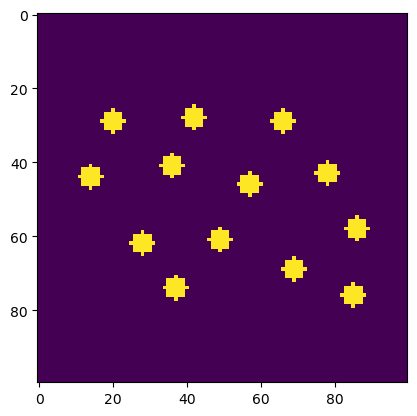

In [66]:
labels = np.load('training/instance_masks/2045541.npy')
import matplotlib.pyplot as plt

plt.imshow(labels[:,50,:])

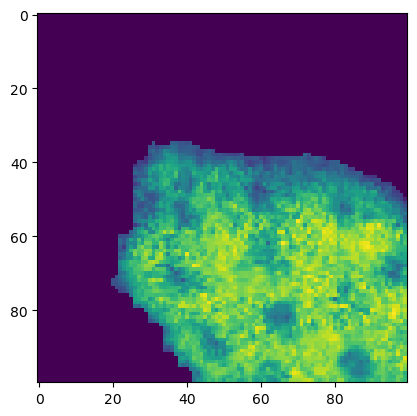

In [67]:
image = np.load('training/subvols/image/2045541.npy')
plt.imshow(image[:,4,:])

In [ ]:
# Then set up training
train_loader, val_loader = setup_training(
    image_dir='path/to/images',
    label_dir='training/instance_masks'
)

# Check the loader
check_loader(train_loader, 4, plt=True)

# Train SAM
sam_training.train_sam(
    name="microtubule_sam",
    save_root="models",
    model_type="vit_b",
    train_loader=train_loader,
    val_loader=val_loader,
    n_epochs=5,
    n_objects_per_batch=5,
    with_segmentation_decoder=True,
    device="cuda" if torch.cuda.is_available() else "cpu"
)